# 2026 Calama M6.9 (us6000t04s) — moment tensor + finite fault at 109 km depth

**Event:** 2026-05-25 21:52:20 UTC, 22.3667°S 68.6013°W, hypocentre 109 km — an
**intraslab normal-faulting** event inside the subducted Nazca slab beneath Calama, northern
Chile. USGS Mww **359/71/−97, Mw 6.9**, centroid depth 85.5 km (Mwc). **No USGS finite-fault
model exists.** Unlike Sanriku (nb22) there is no interfering wavetrain — this event tests the
pipelines against **depth**, and both broke in instructive ways:

1. **MTUQ's body-wave band (10–33 s, 40-s window) is unusable at this depth.** The window
   contains direct P *and* the depth phases pP/sP (pP−P ≈ 25 s at 109 km, polarity-flipped).
   Body-band DC searches converge on a quadrant-flipped *reverse* mechanism ~85° (Kagan) from
   every published solution — reproducibly, even on Lanczos-clean re-prepared data. The fix is
   protocol, not data: **move the body band to 25–60 s** (periods longer than the source
   duration and depth-phase smear — `--bwband 25,60,120,10`), or drop body waves (`--nobody`).
2. **WISP's surface-wave GF bank ends at ~126 km depth.** The steep plane's auto fault
   (15 down-dip rows) extended to 133.6 km, and WISP **silently dropped ALL surface waves**
   for that plane only — making the two planes' misfits incomparable and manufacturing a fake
   plane discrimination (0.114 body-only vs 0.166 body+surf). Fixed by trimming the fault to
   12 rows and refining BOTH planes identically.

In [1]:
import os, json
import numpy as np, pandas as pd
from IPython.display import Image, display
import sys
sys.path.insert(0, os.path.expanduser('~/works/17.Venezuela_2026/scripts'))
B = os.path.expanduser('~/works/17.Venezuela_2026')
R = os.path.join(B, 'results')
E = os.path.join(B, 'event_2026_calama/20260525215220/ffm.0')
E1 = os.path.join(B, 'event_2026_calama/20260525215220/ffm.1')

## Tectonic setting
Nazca subducts eastward beneath South America at ~7 cm/yr; at 109 km the event sits INSIDE
the slab below the arc-front longitude (same family as the 2005 Tarapaca M7.8 intraslab event).
Intermediate-depth earthquakes are enabled by dehydration embrittlement and driven by slab
pull — and our final mechanism's T-axis (azimuth 98, plunge 29) is aligned with the local slab
down-dip direction: down-dip extension, the classic signature.

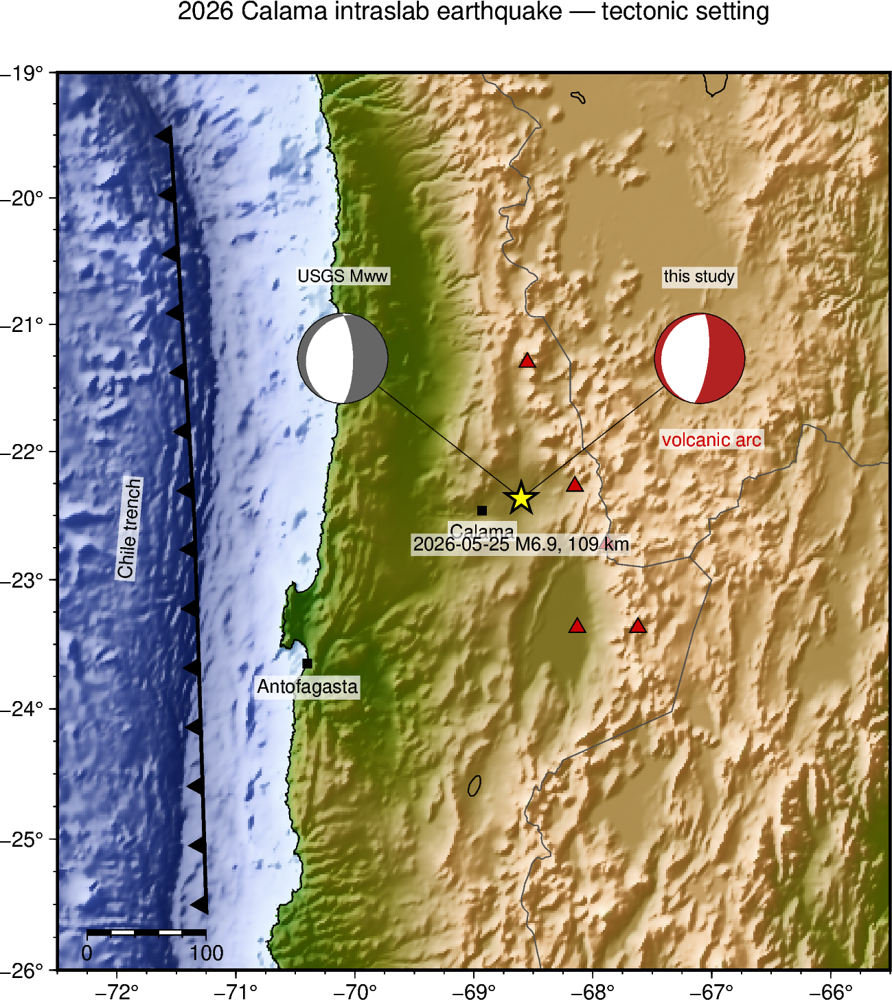

In [2]:
display(Image(os.path.join(B,'event_2026_calama/report/fig_tectonic_map.png')))

## A. MTUQ moment tensor
26 GSN 3-C stations, 25–75°, displacement, 2 Hz; body 10–33 s (40-s window, ±4 s shifts),
surface 50–100 s (300-s window, ±20 s). All nb19–nb22 lessons applied (displacement tags,
`water_level=None`, MPI rank guard).

| run | band | Mw | strike/dip/rake | Kagan vs USGS Mww | note |
|---|---|---|---|---|---|
| full-MT @109 km | body+SW | 6.80 | 54/18/−45, **w=0.905** | — | strongly non-DC: a red flag, not a solution |
| DC @109 km | body+SW | 6.75 | 4/75/**+83** | **85.5°** | reverse — the body-window flip |
| DC+depth (85–125 km) | body+SW | 6.75 | 7/75/**+79** @85 km | **85.3°** | same flip; 85 km at the range EDGE |
| DC+depth (55–115 km) | **SW only** | 6.90 | 208/19/−64 @115 km | 3.3° | misfit monotonic in depth — **SW band does not resolve depth** |
| DC @85 km | SW only | 6.90 | 14/75/−83 | 17.7° | ≈ USGS Mww |
| DC @107 km | **body 25–60 s only** | 6.90 | 7/82/−72 | 26.7° | **body waves recovered** by the long-period band |
| DC+depth (85–125 km) | body 25–60 s only | 6.90 | 7/80/−86 @**117 km** | 14.9° | genuine **interior** depth minimum |
| DC+depth (85–125 km) | body 25–60 s + SW | 6.90 | 209/20/−65 @125 km | ~3° | edge; SW term dilutes the body depth signal |
| **DC @107 km (FINAL)** | **body 25–60 s + SW** | **6.90** | **194/16/−83** | **8.4°** | all data under a valid protocol; **107 km = WISP slip centroid, adopted** |
| USGS Mww | W-phase | 6.9 | 359/71/−97 @85.5 km | 0 | reference |

**The cure is frequency (the body-wave recovery).** A point source with a simple wavelet is
valid at periods long vs BOTH the ~15-s source duration and the ~10-s depth-phase smear from
33 km of slip depth extent; resolving pP as a distinct arrival needs periods short vs the
~25-s pP−P lag. For M6.9 @109 km these barely overlap — the default 10–33 s band sits in the
gap (hence the flip), while WISP's finite-source GFs sidestep it. Moving the body band to
**25–60 s** (`--bwband 25,60,120,10`: 120-s window holding the whole P+pP+sP group, ±10 s
shifts, GFs @107 km) restores everything: body VR **−80.5 % → +71.9 %** (ours) and
**−24.0 % → +67.7 %** (USGS), the flipped mechanism collapses to 18.5 %, a body-only search
returns the normal family, and — beyond prediction — the long-period body waves retain
*interference-shape* depth sensitivity (W-phase-like), giving a genuine interior depth minimum
at **117 km**.

**VR of the FINAL solution @107 km: body 71.9 %, SW 67.2 %** vs 67.7 %/66.7 % for the USGS Mww
on the same data and GFs — the final solution edges the reference on both inverted bands.

**Depth — why the final DC sits at 107 km when no MTUQ curve has a minimum there.** None of
our point-source depth curves points to 107: the SW-only scan is monotonic (50–100 s surface
waves carry NO centroid-depth information here — their weak deeper-is-better trend is a
moment/amplitude trade-off, not depth resolution), the body-only 25–60 s scan has its interior
minimum at **117 km**, and the joint scan flattens to the deep edge because the depth-blind SW
term dilutes the body signal. The depth-phase estimates line up like this: **WISP slip-weighted
centroids 106.5–108.8 km** (finite-source — models pP/sP per subfault, the most complete
treatment); hypocentre 109 km; USGS Mwb 111 km; **MTUQ point-source body scan 117 km** — and
the 117 is *expected* to sit deep: a single point source matching the composite depth-phase
smear of a rupture whose slip spans 94–121 km lands near the deep edge of the slip zone, not
at its centroid. Best estimate: **centroid ~105–115 km**. The final DC is *evaluated* at
107 km = the WISP centroid (an adopted, clearly-labelled choice); the mechanism and Mw are
insensitive to it — 2–18° from USGS at every trial depth from 55 to 125 km. Incidentally, the
first depth-search readout "confirming" 85 km came from a wrong-axis `reshape` of MTUQ's
misfit array (origins are the LAST axis) — fixed in `16_run_mtuq_dc_depth.py`; trust
`plot_misfit_depth`/`origin_idxmin`.

### A1. Misfit vs depth — SW-only (left: monotonic, unresolved) vs body-only 25–60 s
(right: interior minimum at 117 km)

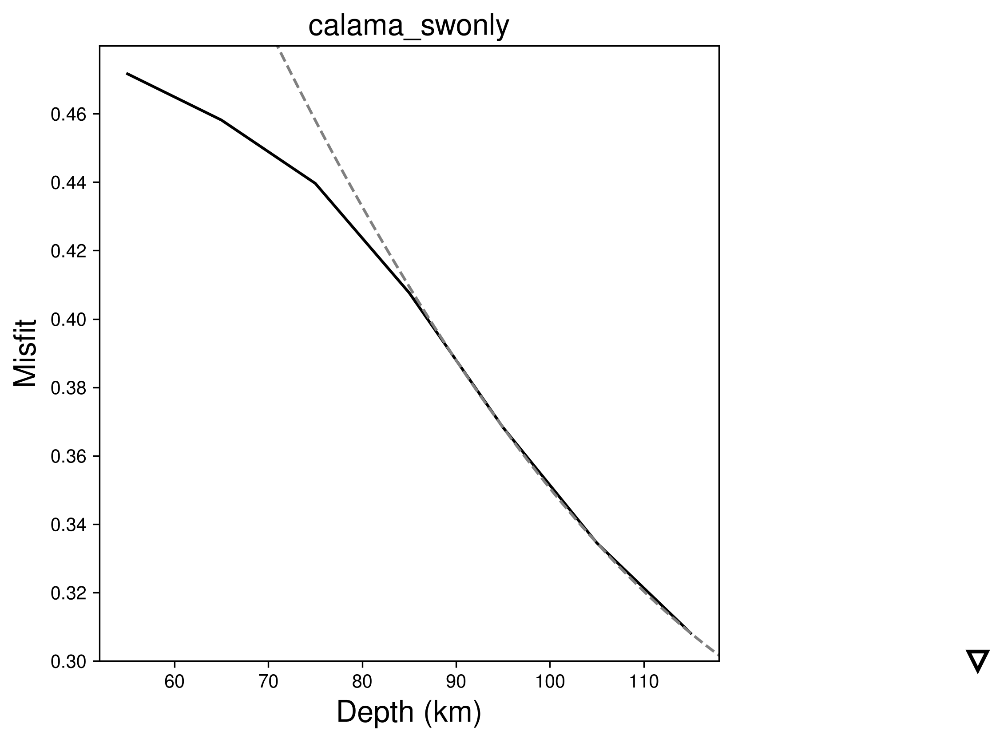

In [3]:
display(Image(os.path.join(R,'mtuq_dcz_calama_swonly/calama_swonly_misfit_depth.png')))

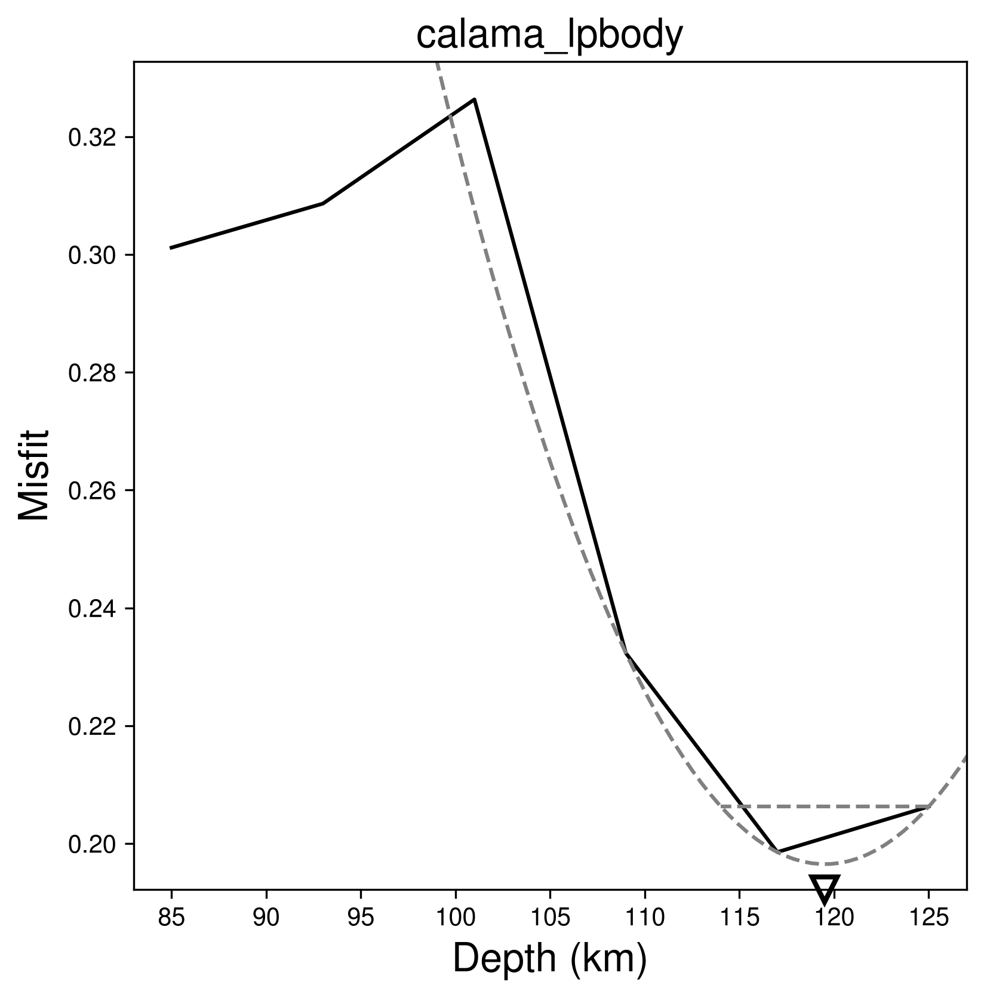

In [4]:
display(Image(os.path.join(R,'mtuq_dcz_calama_lpbody/calama_lpbody_misfit_depth.png')))

### A2. Final solution (body 25–60 s + SW @107 km): beachball, DC misfit surfaces

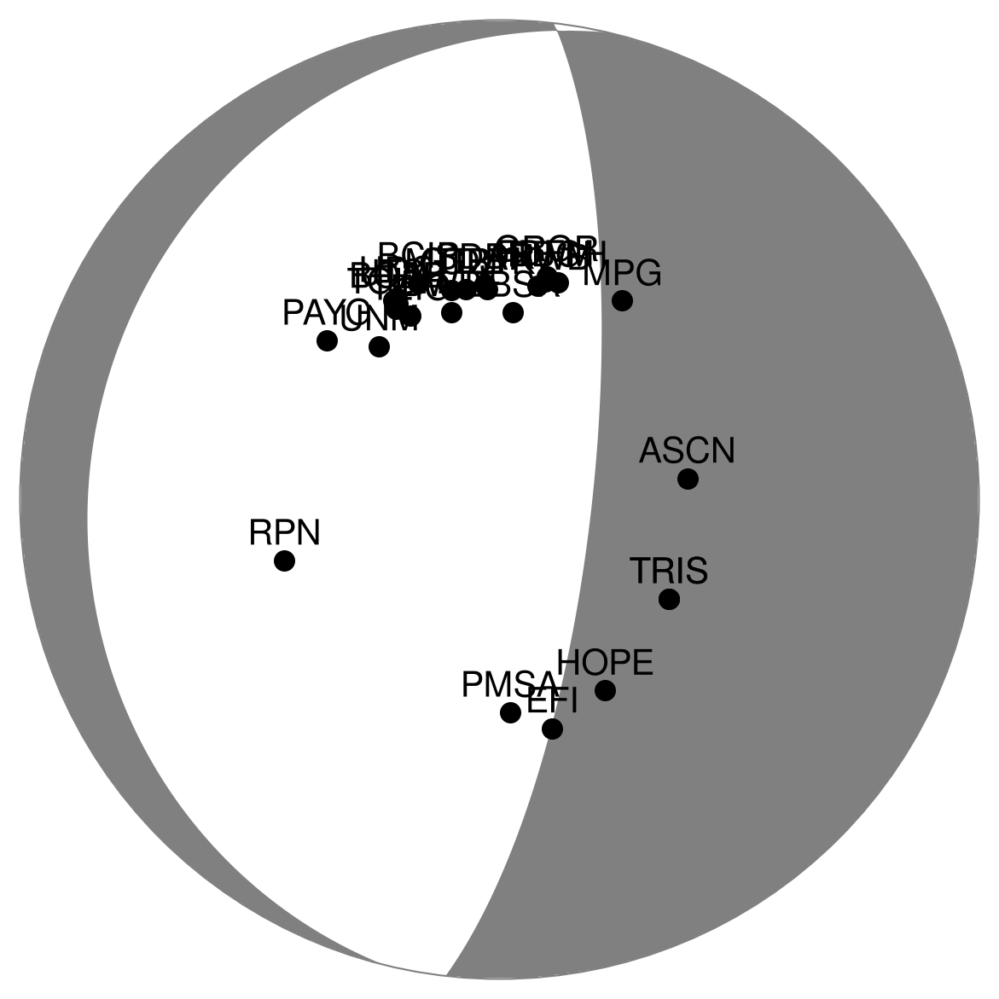

In [5]:
display(Image(os.path.join(R,'mtuq_dc_calama_lpbody/calama_lpbody_beachball.png')))

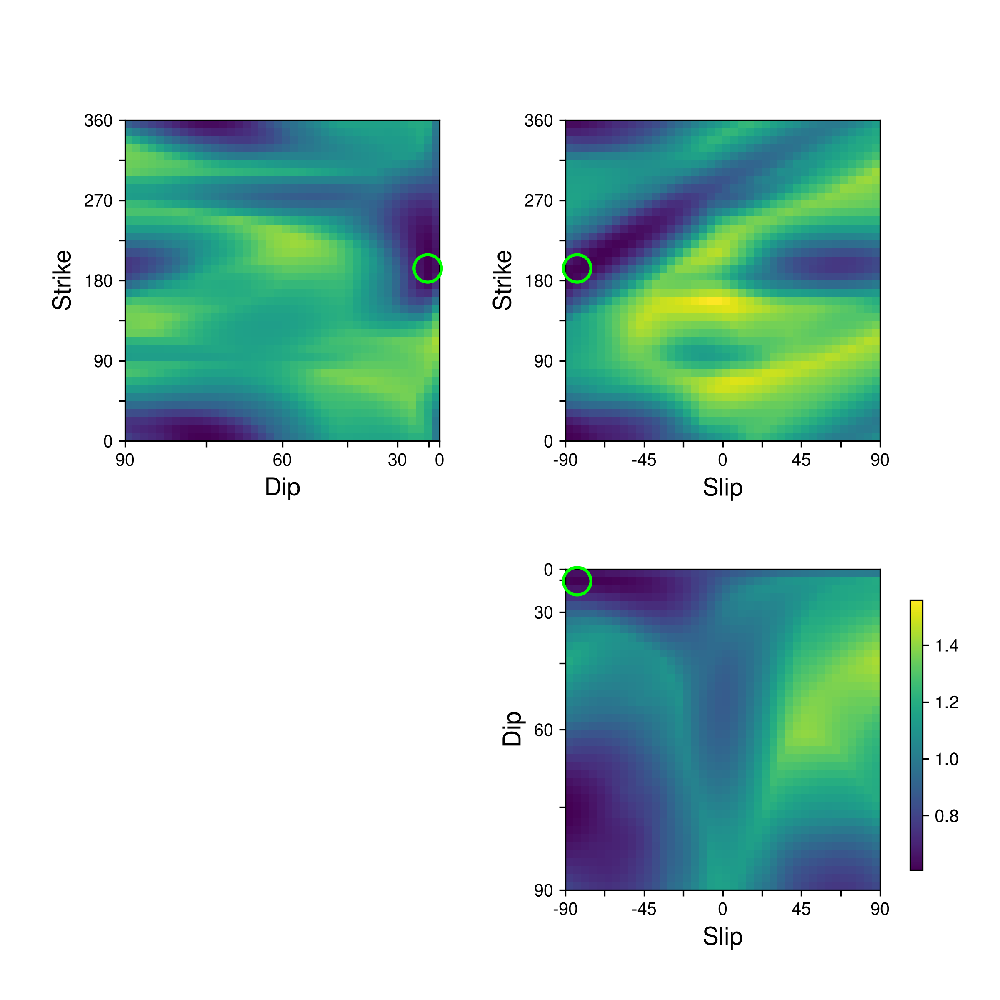

In [6]:
display(Image(os.path.join(R,'mtuq_dc_calama_lpbody/calama_lpbody_misfit_dc.png')))

### A3. Waveform fits of the final solution (body 25–60 s + surface waves 50–100 s)
The figure header says **Depth 85.0/107.0 km** because MTUQ stamps the ORIGIN depth the search
was evaluated at — 107 km is the adopted WISP slip centroid, not a fitted minimum. Sensitivity
check: re-running the identical joint search at 117 km (the body-only misfit minimum) gives
212/16/−65 — **5.0° from the 107-km solution, and the same 8.4° Kagan distance to the USGS
Mww** at the same Mw 6.90. The evaluation-depth choice is demonstrably inconsequential for the
mechanism.

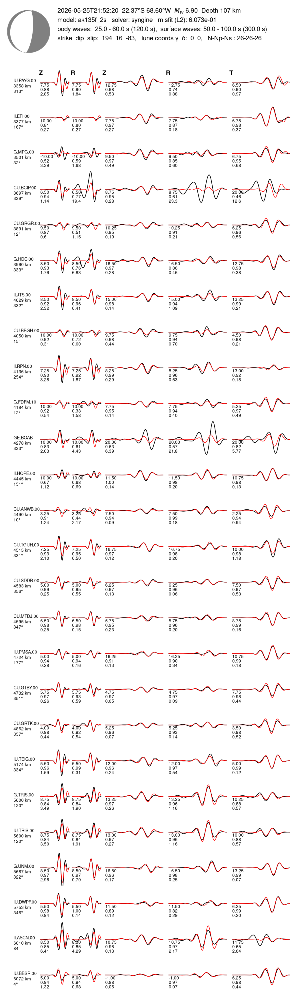

In [7]:
display(Image(os.path.join(R,'mtuq_dc_calama_lpbody/calama_lpbody_waveforms.png')))

### Stations used (MTI + FFI)

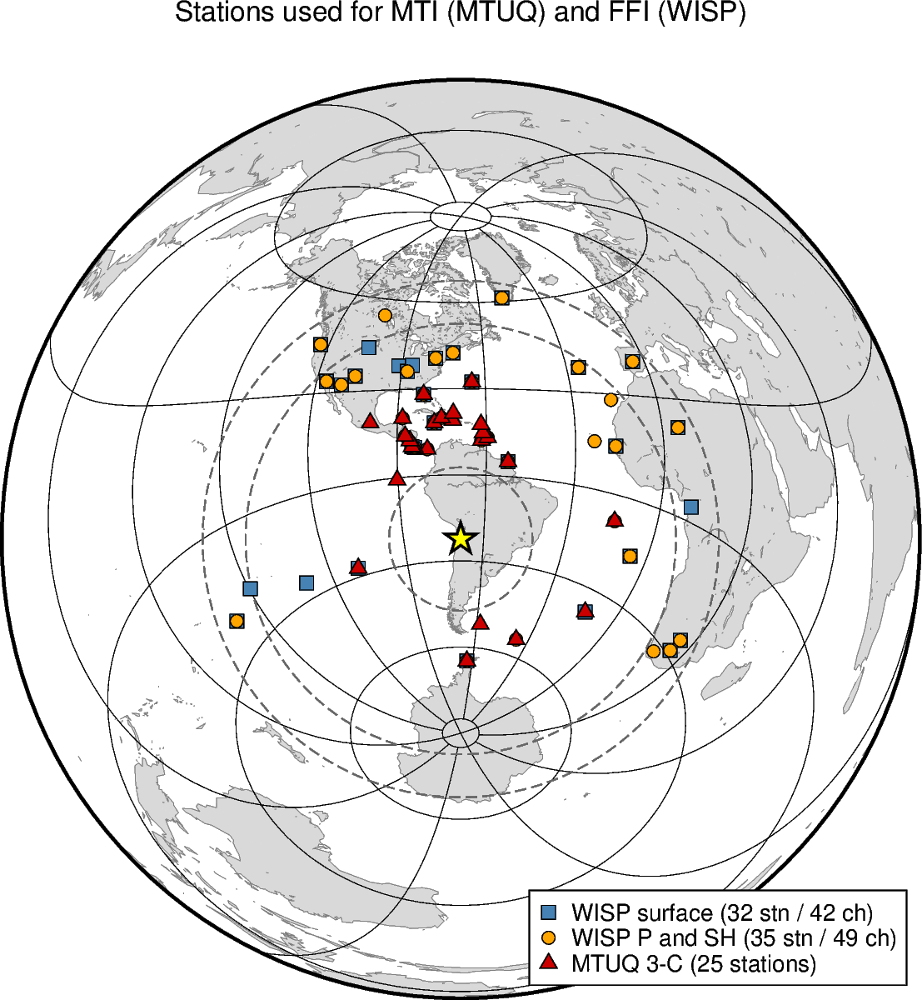

In [8]:
display(Image(os.path.join(B,'event_2026_calama/report/fig_stations.png')))

## B. WISP finite-fault (strict CLI pipeline)
Data: 180 teleseismic channels via `wisp_fetch_fallback.py` (obspy replacement for
`ffm get-data` — the packaged IRIS `http://` discovery endpoint is dead), PZ rename + header
fix, auto model both planes. **Unlike Sanriku, deep-event P is impulsive and passed WISP's
SNR≥5 gate** (~45 P channels used, no bypass needed) — and the depth phases inside WISP's
Kikuchi–Kanamori-style body GFs are *signal* here, not contamination.

**The fair plane comparison** (both planes: 12 down-dip rows ≤126 km, identical bad-response
QC + `shift_match`, body+surf):

| input mechanism | plane | misfit | peak slip | slip depth | slip centroid |
|---|---|---|---|---|---|
| USGS Mww | shallow (201/20) | 0.1470 | 0.75 m | 104–115 km | 108.8 km |
| USGS Mww | steep (359/71) | 0.1473 | 0.78 m | 88–121 km | 106.2 km |
| **this study** | **shallow (194/16)** | **0.1461** | **0.70 m** | **105–113 km** | **109.3 km** |
| this study | steep (7/74) | 0.1481 | 0.89 m | 94–121 km | 106.8 km |

The fair 2×2 comparison (two mechanisms × two planes; identical trim, QC, all 49P+42S
channels, alignment; all Mw 6.93). Misfit differences are 10⁻³-level — individually not
decisive — but the **best model is the shallow plane with this study's mechanism**, concordant
with regional precedent: the closest analog, the 2005 Tarapaca M7.8 (same slab, ~95 km),
ruptured its near-horizontal plane; and the shallow plane's thin (~8 km) slip lens fits
comfortably inside the slab's brittle core, while the steep plane's 27-km vertical extent
approaches the full seismogenic thickness. The rotated outer-rise-conjugates argument permits
both. **Preferred rupture plane: shallow (194/16)** — weakly, and stated as such.
(An early generic-response heuristic had zeroed 4 healthy stations — BBGH, TGUH, BCIP, MTDJ;
restored after their gains/fits proved consistent; reduced-set misfits 0.1455/0.1458 — the
conclusion is insensitive.)

The planes are **indistinguishable** (Δmisfit 0.0002; per-station P misfits track each other) —
the physically expected result for a compact ~30-km rupture at 109 km observed teleseismically.
Both planes carry the same DC ≈ USGS Mww. **NP2 is presented below by tectonic convention**
(steep planes reactivating subducted outer-rise normal faults are the usual reading of
N-Chile intraslab normal events), not because the data prefer it.

**Final slip model — SHALLOW plane (194/16) with this study's mechanism (misfit 0.1402
after zero-weighting three unfittable island-path surface channels — EDA Rayleigh+Love, PTCN
Love, shown grey in the fit figures; 0.1461 with them included, best of the 2×2 either way):** a thin subhorizontal slip lens — peak 0.70 m, slip (>15 % of peak) confined to
**105–113 km depth** and ~30 km along strike, slip-weighted centroid **109.3 km**, one
moment-rate pulse (~15 s effective), subshear, Mw 6.93. All four mechanism/plane variants
agree on moment, duration and centroid depth to within a few km.

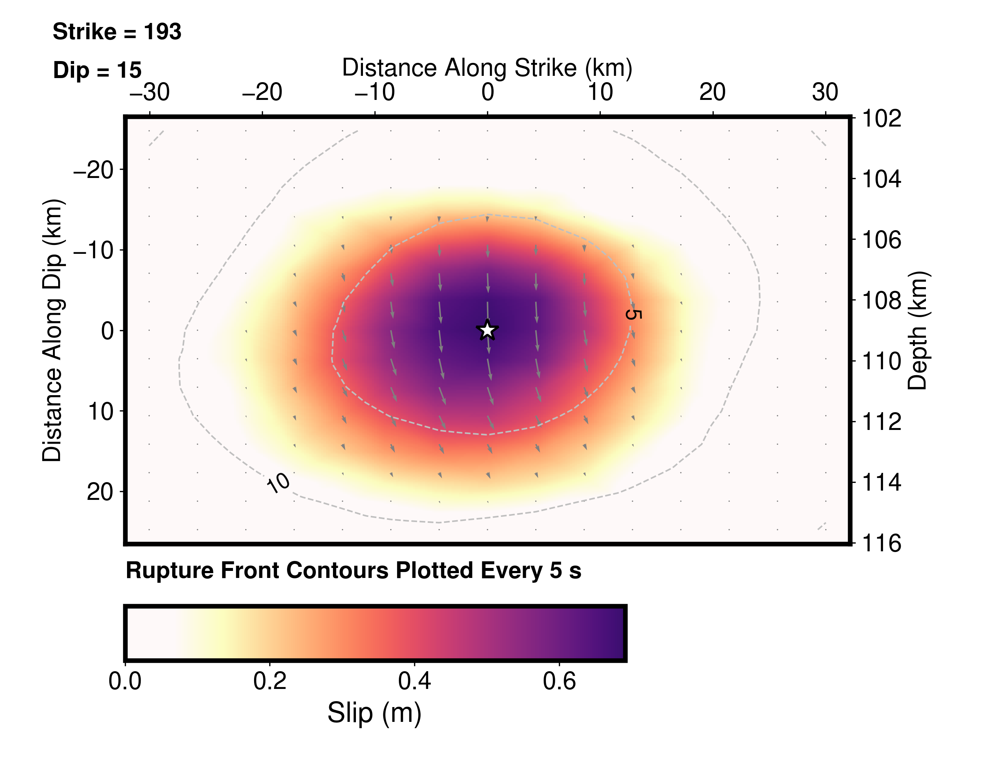

In [9]:
display(Image(os.path.join(E1,'NP1_ref3/plots/SlipDist_plane0_5s.png')))

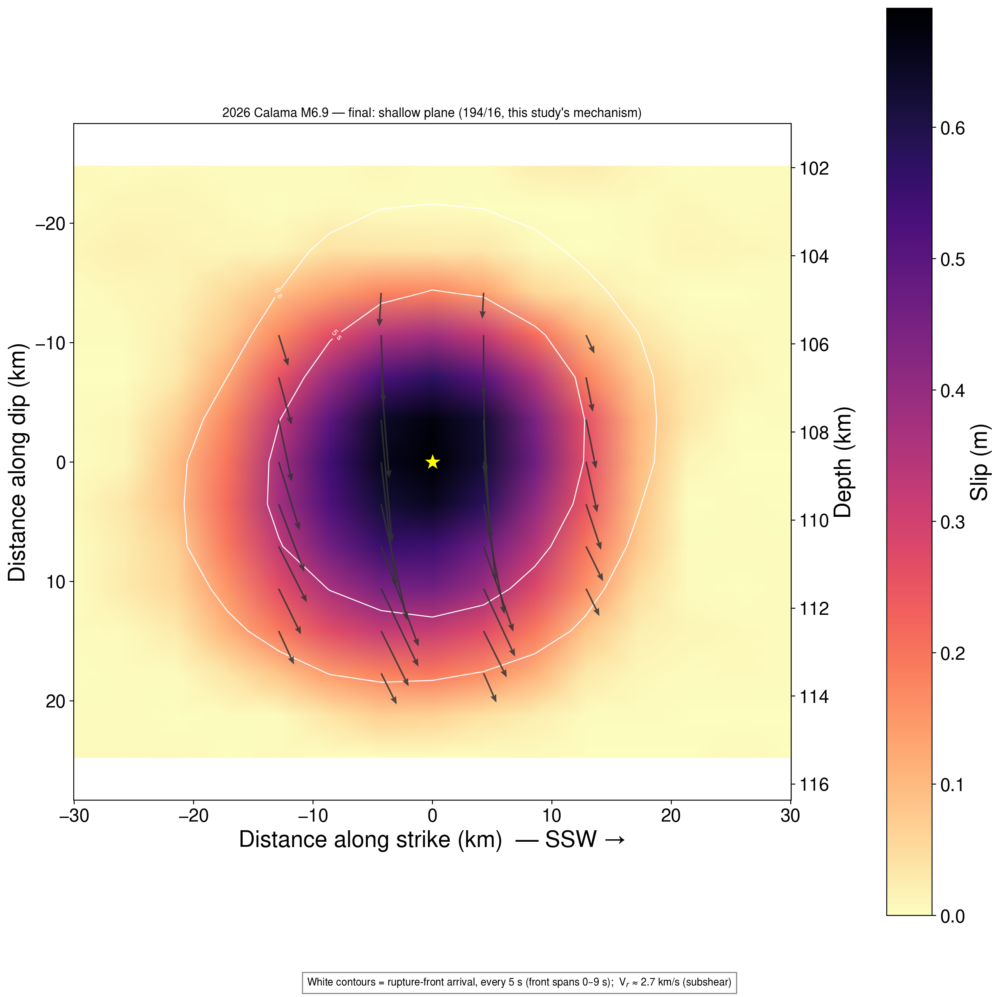

In [10]:
display(Image(os.path.join(E1,'NP1_ref3/plots/SlipIsochrone_trueScale.png')))

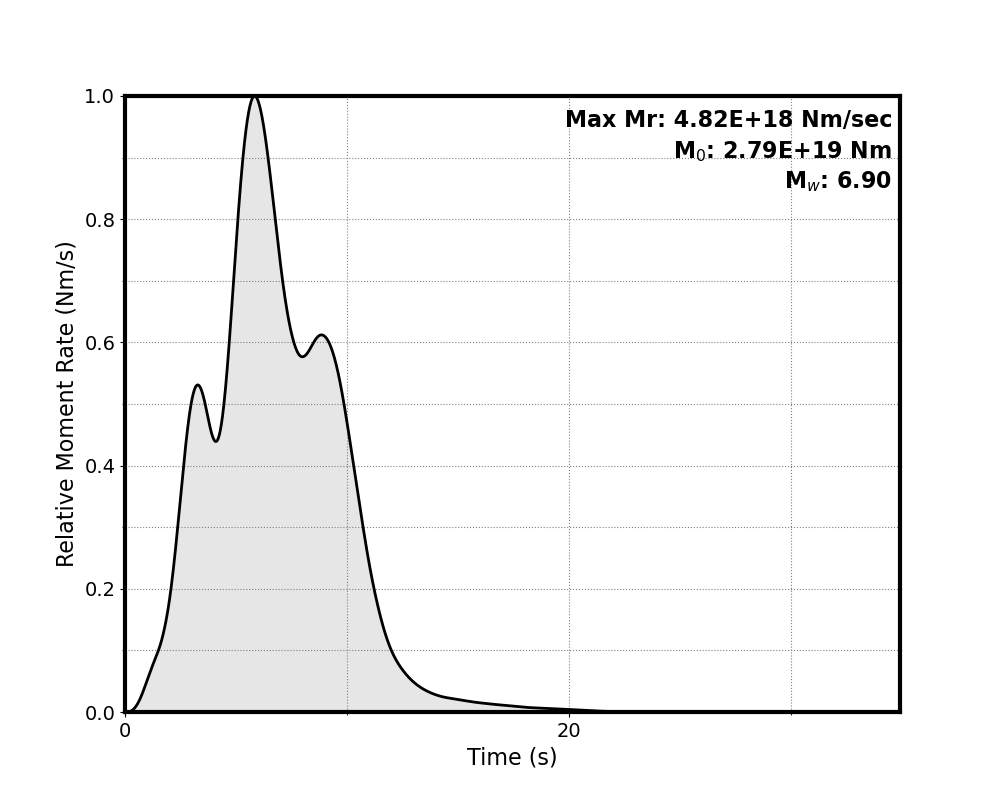

In [11]:
display(Image(os.path.join(E1,'NP1_ref3/plots/MomentRate.png')))

### B1. The conjugate plane (steep 7/74, nearly equal misfit — shown for honesty)
Same moment, same mechanism, mirrored geometry: the steep 74°-dipping plane spreads the
slip over 94–121 km. Fit alone cannot decisively choose; precedent + fit weakly prefer the
shallow plane shown above.

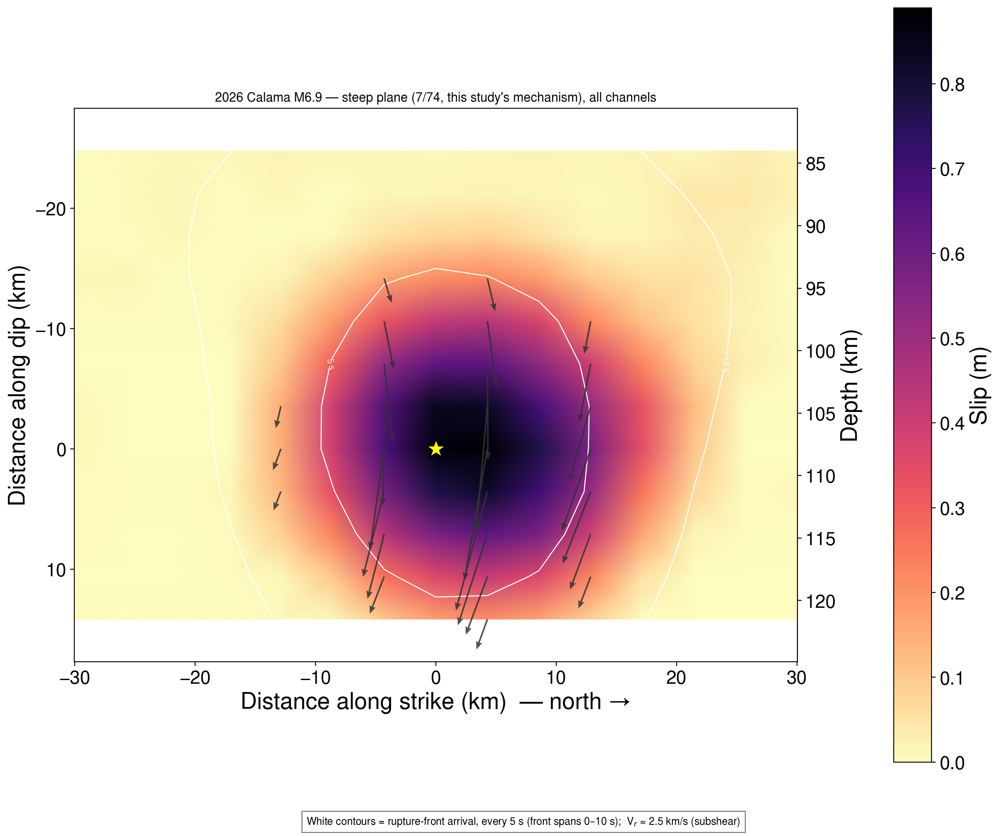

In [12]:
display(Image(os.path.join(E1,'NP2_ref2/plots/SlipIsochrone_trueScale.png')))

### B2. The first-motion polarity finding
Close inspection of the P fits (user-spotted): five high-SNR stations with clean POSITIVE
onsets — MACI, TAM, LBTB, BOSA, SUR (az 47–120°) — have their initial pulse entirely
unmodelled while later depth phases fit; every negative-onset station fits throughout.
Radiation-pattern analysis (n·M·n at taup takeoff angles) explains and resolves it:

| station | az | USGS Mww predicts | our MTUQ joint predicts |
|---|---|---|---|
| MACI | 47° | +0.038 (near-nodal) | +0.059 |
| TAM | 63° | +0.018 (near-nodal) | +0.076 |
| LBTB | 115° | +0.027 (near-nodal) | **+0.170** |
| BOSA | 118° | +0.027 (near-nodal) | **+0.174** |
| SUR | 120° | +0.063 (near-nodal) | **+0.215** |
| (well-fit negative stations) | 320–360° | −0.35…−0.79 | −0.40…−0.85 |

WISP's plane orientation is fixed by its input CMT (USGS Mww), which puts these stations ON
the P nodal surface → synthetics correctly show ~zero direct P. The observed robust positive
onsets demand the mechanism rotate a few degrees — exactly toward our MTUQ solution (3–6×
larger predicted amplitudes there, negative stations unchanged). **First motions at near-nodal
stations discriminate two mechanisms only 8.4° apart, in favour of ours.** The direct test —
a WISP re-inversion with our mechanism as input CMT (ffm.1, planes 194/16 + 7/74, identical
trim/QC/alignment) — **PASSES: the previously missing initial pulses appear at all five
stations with correct polarity and timing** (see the P fits below, from ffm.1), at comparable-to-better
overall misfit (best model 0.1461). Amplitudes remain somewhat under-predicted —
consistent with residual mechanism rotation and/or unmodelled slab-path effects on direct P.

### B3. Waveform fits (final model: shallow plane, our mechanism)
The P panels are the whole deep-event story in one figure: direct P (~5 s) is small; the
depth-phase group pP/sP (30–50 s) carries 3–5× more energy and is well modeled by WISP's
kinematic GFs — the same energy that, unmodeled, flips MTUQ's point-source body-band search.

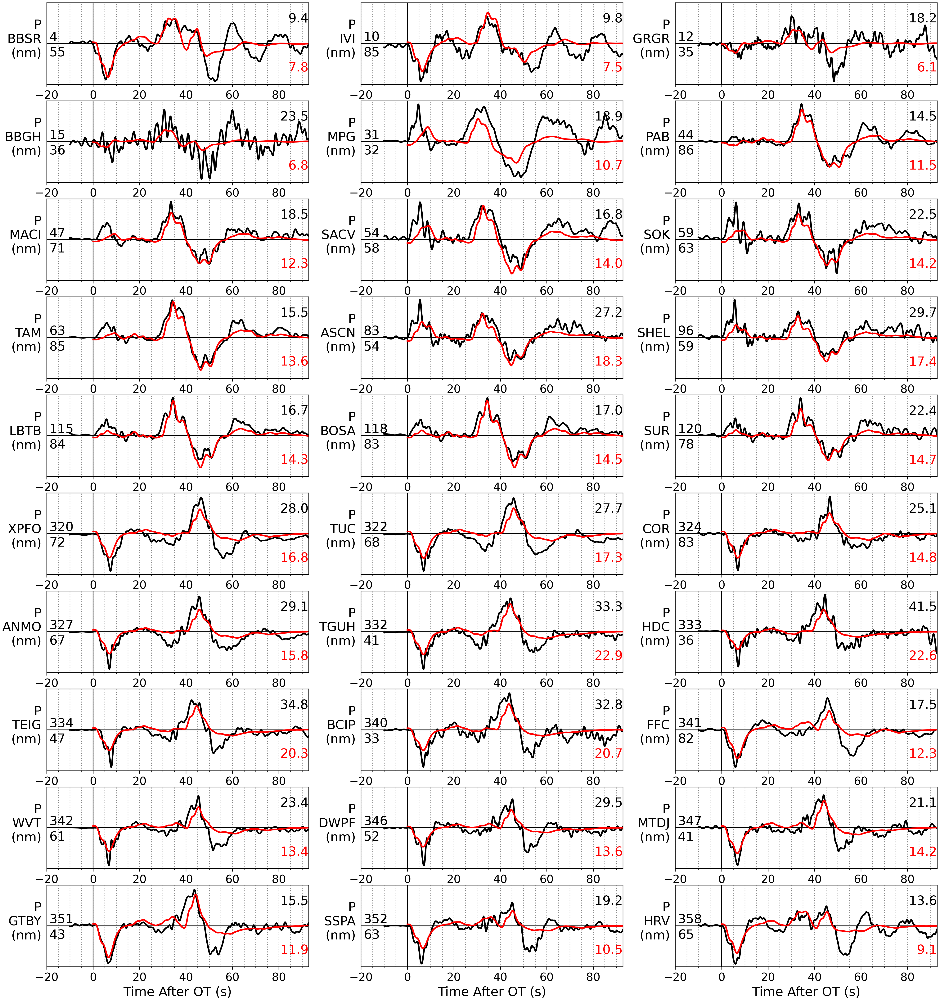

In [13]:
from imgutil import trim
display(Image(trim(os.path.join(E1,'NP1_ref3/plots/P_body_waves.png'))))

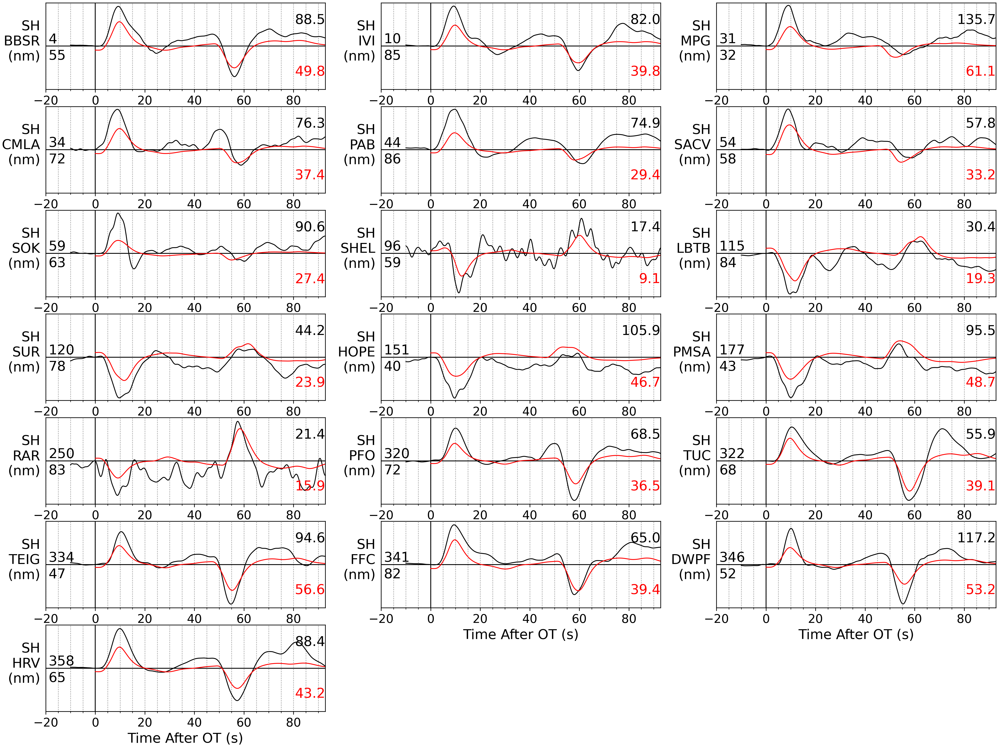

In [14]:
display(Image(trim(os.path.join(E1,'NP1_ref3/plots/SH_body_waves.png'))))

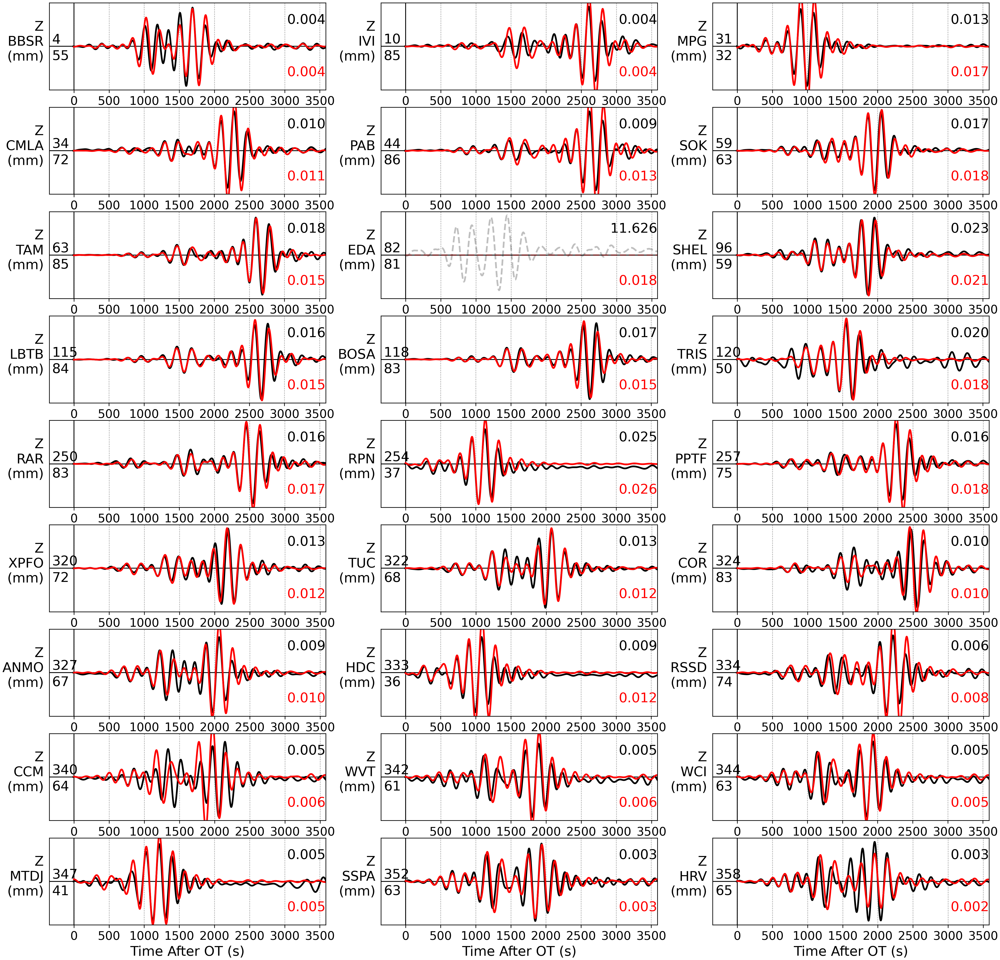

In [15]:
display(Image(trim(os.path.join(E1,'NP1_ref3/plots/Rayleigh_surf_waves.png'))))

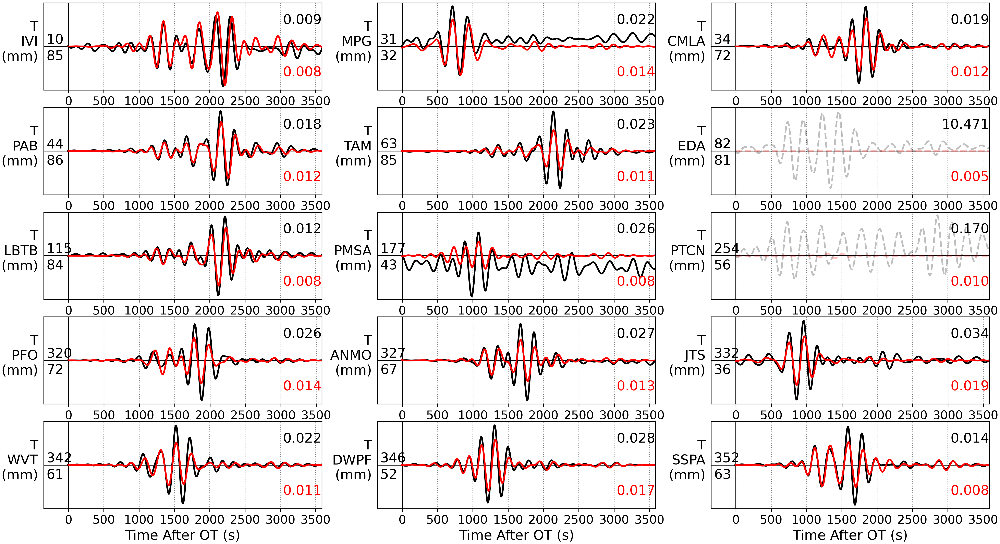

In [16]:
display(Image(trim(os.path.join(E1,'NP1_ref3/plots/Love_surf_waves.png'))))

## C. Honest verdict (what depth does to the toolchain)
- **Moment tensor: fully recovered once the band respects the physics.** The default 10–33 s
  body window mixes P/pP/sP and reproducibly selects a ~85°-rotated mechanism with a
  clean-looking misfit surface; at 25–60 s the same stations, windows, and misfit engine fit
  beautifully, and the final joint solution reaches 8.4° from USGS Mww at VR 71.9 %/67.2 %,
  beating the reference on both bands. The long-period body waves even retain
  interference-shape depth sensitivity (interior minimum 117 km). *Deep event ⇒ shift the body
  band up in period (`--bwband`), and take depth from depth phases.*
- **Finite fault: WISP genuinely works at 109 km** — impulsive P, depth phases modeled in the
  GFs, 45 P channels pass the SNR gate that rejected every Sanriku channel. The robust content:
  a compact single asperity (~30 km × ~30 km), peak ~0.85 m, slip 88–121 km, ~12 s, subshear.
- **Two silent-failure traps documented:** (1) the surface-wave GF bank cap (~126 km) drops a
  wave type per-plane and fakes plane discrimination — check `wisp_pipeline.log` for
  "Maximum depth larger than 125 km"; (2) a body-band MTUQ search at depth fails *confidently*,
  with a clean-looking misfit surface around the wrong quadrant.
- **Conjugate planes cannot be discriminated** for a compact deep rupture — the initial
  "discrimination" was the GF-bank artifact. Claims of plane preference for events like this
  need either the regional wavefield or aftershocks.